# Geoplanar Example with Building Footprints

This notebook provides an example of preprocessing building footprints for the centre of Berlin.

*Note that you will need to have pyarrow installed if you want to read the parquet files. 

```
conda install -c conda-forge pyarrow

or 

pip install pyarrow
```

Notebook contents:

0. Import data and make valid, explode multipolygons, keep only polygons

1. Overlapping buildings

    1a. Merge overlapping buildings

    1b. Trim remaining overlapping buildings
    
2. Merge collapsed buildings
3. Snap buildings

## 0. Import data and make valid, explode multipolygons, keep only polygons

In [1]:
import numpy as np
import geopandas as gpd
import geoplanar

In [2]:
buildings = gpd.read_parquet("../../../geoplanar/datasets/buildings_berlin.parquet")

In [3]:
buildings

,geometry
211,"POLYGON ((13.37455 52.50972, 13.37526 52.50978..."
246,"POLYGON ((13.37725 52.52002, 13.37729 52.52002..."
247,"POLYGON ((13.37342 52.52, 13.37594 52.52, 13.3..."
248,"POLYGON ((13.37797 52.51993, 13.37797 52.51992..."
249,"POLYGON ((13.36894 52.52529, 13.36863 52.52525..."
...,...
1074652,"POLYGON ((13.40843 52.50037, 13.40839 52.50039..."
1074764,"POLYGON ((13.37356 52.52755, 13.37357 52.5268,..."
1074775,"POLYGON ((13.40404 52.51573, 13.40397 52.51579..."
1074787,"POLYGON ((13.38176 52.51681, 13.38276 52.51688..."


<Axes: >

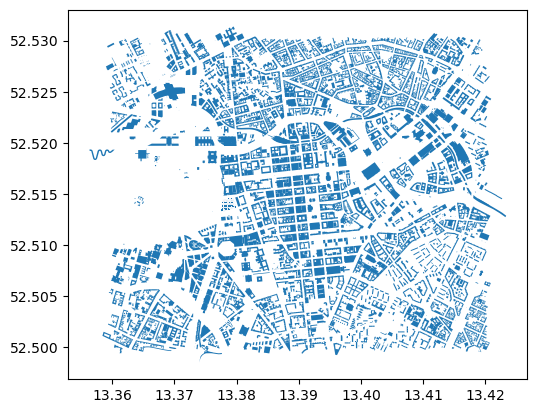

In [4]:
buildings.plot()

In [5]:
buildings.explore()

In [6]:
buildings.type.value_counts()

Polygon         8714
MultiPolygon       2
Name: count, dtype: int64

In [7]:
# make valid
buildings["geometry"] = buildings.make_valid()

In [8]:
buildings.type.value_counts()

Polygon               8707
GeometryCollection       5
MultiPolygon             4
Name: count, dtype: int64

In [9]:
# explode GeometryCollection and MultiPolygon
buildings = buildings.explode(ignore_index=True)

In [10]:
buildings.type.value_counts()

Polygon       8721
LineString       5
Name: count, dtype: int64

In [11]:
# remove non-Polygon geometries
buildings = buildings[buildings.type == "Polygon"]

In [12]:
buildings.type.value_counts()

Polygon    8721
Name: count, dtype: int64

## 1. Overlapping buildings

### 1a. Merge overlapping buildings

In [13]:
buildings=buildings.reset_index(drop=True)
buildings.shape

(8721, 1)

In [14]:
# set precision so that polygons don't have rounding errors and are effectively snapped to the same precision grid
buildings["geometry"] = buildings.set_precision(0.00001)
buildings.shape

(8721, 1)

In [15]:
buildings.type.value_counts()

Polygon         8697
MultiPolygon      24
Name: count, dtype: int64

In [16]:
buildings[buildings.type=='MultiPolygon'].explore()

In [17]:
buildings = buildings.explode()

In [18]:
buildings.type.value_counts()

Polygon    8746
Name: count, dtype: int64

In [19]:
buildings=buildings.reset_index(drop=True)

In [20]:
## merge buildings that overlap either 1) at least .10 percent or 2) 500sqm
buildings = geoplanar.merge_overlaps(buildings, merge_limit=30, overlap_limit=0.1)
buildings.shape

(8611, 1)

In [21]:
#the output may result in MultiPolygons. This is typically a result of a complex relationship between geometries and is expected. 
# These multipolygons are usually comprised of just one polygon so can be exploded
buildings.type.value_counts()

Polygon               8202
GeometryCollection     405
MultiPolygon             4
Name: count, dtype: int64

In [22]:
buildings[buildings.type=='MultiPolygon'].explore()

In [23]:
buildings = buildings.explode()

In [24]:
buildings.type.value_counts()

Polygon    8206
Name: count, dtype: int64

### 1b. Trim overlapping buildings

In [27]:
## trim remaining overlaps
buildings = geoplanar.trim_overlaps(buildings, strategy="largest")
buildings.shape

(8206, 1)

In [28]:
buildings.type.value_counts()

Polygon    8206
Name: count, dtype: int64

In [29]:
# check for remaining overlaps
geoplanar.overlaps(buildings)

array([], shape=(2, 0), dtype=int64)

## 2. Merge Collapsed Buildings

Checks for tiny polygons which are too small to represent individual buildings. Buffer size can be changed from 0.4 to the appropriate distance.

In [30]:
buildings = buildings.reset_index(drop=True)

In [36]:
buildings

,geometry
0,"POLYGON ((4593474.881 5820516.414, 4593483.686..."
1,"POLYGON ((4593681.248 5821623.434, 4593666.316..."
2,"POLYGON ((4593341.173 5821618.061, 4593335.064..."
3,"POLYGON ((4593637.319 5821648.196, 4593637.681..."
4,"POLYGON ((4593038.918 5822124.341, 4593037.518..."
...,...
8201,"POLYGON ((4595744.478 5819514.978, 4595745.793..."
8202,"POLYGON ((4593324.097 5822408.037, 4593311.499..."
8203,"POLYGON ((4595411.003 5821222.674, 4595445.738..."
8204,"POLYGON ((4593894.717 5821361.485, 4593937.395..."


In [37]:
#buildings = buildings.set_precision(0.00001)
# need to project the crs so that buildings can be shrinked by 0.4 m
buildings = buildings.to_crs(crs=31468)

In [38]:
shrink=buildings.buffer(-0.4, resolution=2)
emptycheck = shrink.is_empty
collapse = buildings[emptycheck]

In [39]:
buildings[emptycheck].explore()

In [40]:
# merge touching collapsing buildings
buildings = geoplanar.merge_touching(buildings, np.where(shrink.is_empty), largest=True)
buildings.shape

(8188, 1)

In [41]:
buildings.explore()

In [42]:
overlapping = geoplanar.overlaps(buildings)

In [43]:
# merge collapsed results in overlapping buildings, but these are due to floating point errors and do not actually overlap
buildings.iloc[overlapping[0]].explore()

In [44]:
buildings.type.value_counts()

Polygon    8188
Name: count, dtype: int64

## 3. Snap Buildings

In [45]:
# snap nearby buildings
buildings["geometry"] = geoplanar.snap(buildings, threshold=0.5)
buildings.shape

(8188, 1)

In [46]:
buildings.type.value_counts()

Polygon    8188
Name: count, dtype: int64

In [47]:
buildings

,geometry
0,"POLYGON ((4593474.881 5820516.414, 4593483.686..."
1,"POLYGON ((4593681.248 5821623.434, 4593666.316..."
2,"POLYGON ((4593341.173 5821618.061, 4593335.064..."
3,"POLYGON ((4593637.319 5821648.196, 4593637.681..."
4,"POLYGON ((4593038.918 5822124.341, 4593037.518..."
...,...
8201,"POLYGON ((4595744.478 5819514.978, 4595745.793..."
8202,"POLYGON ((4593324.097 5822408.037, 4593311.499..."
8203,"POLYGON ((4595411.003 5821222.674, 4595445.738..."
8204,"POLYGON ((4593894.717 5821361.485, 4593937.395..."


In [48]:
buildings.is_valid.value_counts()


True    8188
Name: count, dtype: int64

In [49]:
buildings.explore()

In [53]:
# The following should not be part of the example but I think snapping is not working as expected, because before and after snapping, the snapping algorithm still identifies the same pairs to snap

In [54]:
nearby_a, nearby_b = buildings.sindex.query(
        buildings.geometry, predicate="dwithin", distance=0.5
    )

In [55]:
len(nearby_a)

21148

In [56]:
import pandas as pd

In [57]:
nearby_a, nearby_b = buildings.sindex.query(
    buildings.geometry, predicate="dwithin", distance=0.5
)
overlap_a, overlap_b = buildings.boundary.sindex.query(
    buildings.boundary, predicate="overlaps"
)

self_mask = nearby_a != nearby_b
nearby_a = nearby_a[self_mask]
nearby_b = nearby_b[self_mask]

self_mask = overlap_a != overlap_b
overlap_a = overlap_a[self_mask]
overlap_b = overlap_b[self_mask]

nearby = pd.MultiIndex.from_arrays([nearby_a, nearby_b], names=("source", "target"))
overlap = pd.MultiIndex.from_arrays(
    [overlap_a, overlap_b], names=("source", "target")
)
nearby_not_overlap = nearby.difference(overlap)

In [58]:
nearby_not_overlap

MultiIndex([(  39, 1444),
            (  40, 6853),
            (  54,   56),
            (  56,   54),
            (  70, 7038),
            (  70, 7515),
            (  92,  142),
            ( 116,  126),
            ( 126,  116),
            ( 126,  128),
            ...
            (8074, 4705),
            (8076, 1290),
            (8088, 6605),
            (8094,  162),
            (8116, 3869),
            (8124, 5204),
            (8150,  788),
            (8156, 7570),
            (8174, 5399),
            (8187, 6016)],
           names=['source', 'target'], length=916)

In [59]:
geometry = buildings

In [60]:
threshold=0.5

In [61]:
if not nearby_not_overlap.empty:
    duplicated = pd.DataFrame(
        np.sort(np.array(nearby_not_overlap.to_list()), axis=1)
    ).duplicated()
    pairs_to_snap = nearby_not_overlap[~duplicated]

In [63]:
pairs_to_snap

MultiIndex([(  39, 1444),
            (  40, 6853),
            (  54,   56),
            (  70, 7038),
            (  70, 7515),
            (  92,  142),
            ( 116,  126),
            ( 126,  128),
            ( 130,  131),
            ( 130, 7435),
            ...
            (7758, 7760),
            (7759, 7760),
            (7781, 7882),
            (7804, 7810),
            (7813, 8011),
            (7912, 7913),
            (7913, 7938),
            (8029, 8030),
            (8029, 8031),
            (8030, 8031)],
           names=['source', 'target'], length=458)